# **Group Assignment: Explainability Methods for Machine Learning Models**
Submitted by: Aubrei Gould "Jin" Siababa


> For the model training, we use the code provided in Module 6 under the file name: `06_random_forest_xgboost.` This notebook will be **LIME (Local Interpretable Model-agnostic Explanations)** as its explainability method.




# Preliminaries

In [117]:
pip install lime

In [118]:
pip install shap

In [119]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")


sns.set_style('whitegrid')
sns.set_palette('Set2')
sns.color_palette('Set2')
dlsu_green = "#117a65ff"

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler


# LIME
import lime
import lime.lime_tabular
from lime.lime_tabular import LimeTabularExplainer

# SHAP
import shap

# This is so we can use the .csv file uploaded on GitHub
import ssl
# Ignore SSL certificate errors
ssl._create_default_https_context = ssl._create_unverified_context

In [120]:
churn_df = pd.read_csv('https://raw.githubusercontent.com/jinzalabim/DATA103-Library/refs/heads/main/WA_Fn-UseC_-Telco-Customer-Churn-1.csv')
churn_df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [121]:
churn_df.dtypes

,0
customerID,object
gender,object
SeniorCitizen,int64
Partner,object
Dependents,object
tenure,int64
PhoneService,object
MultipleLines,object
InternetService,object
OnlineSecurity,object


# Exploring the Dataset


In [122]:
churn_df.info()
churn_df.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [123]:
churn_df.isnull().sum()


,0
customerID,0
gender,0
SeniorCitizen,0
Partner,0
Dependents,0
tenure,0
PhoneService,0
MultipleLines,0
InternetService,0
OnlineSecurity,0


There's no null values, so we don't have to handle any missing data.

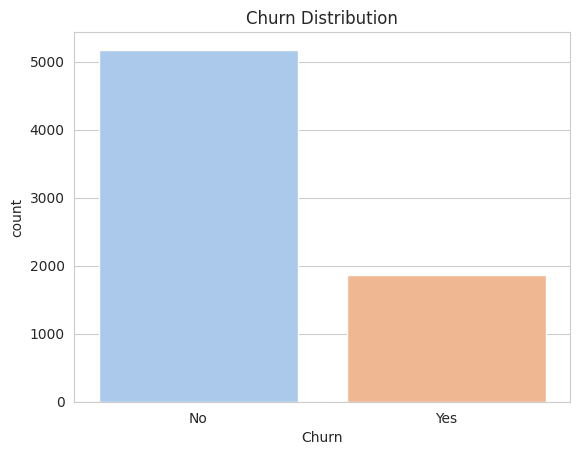

In [124]:
#Plot the distribution of the target variable to see churn rates
sns.countplot(x='Churn', data=churn_df, palette='pastel')
plt.title('Churn Distribution')
plt.show()

There are more customers who churn than stay with the provider.

If we look back at our data types, Total Charges is considered as object. Before we can proceed with the EDA, let's fix it first.


In [125]:
# Convert TotalCharges to numeric
churn_df['TotalCharges'] = pd.to_numeric(churn_df['TotalCharges'], errors='coerce')

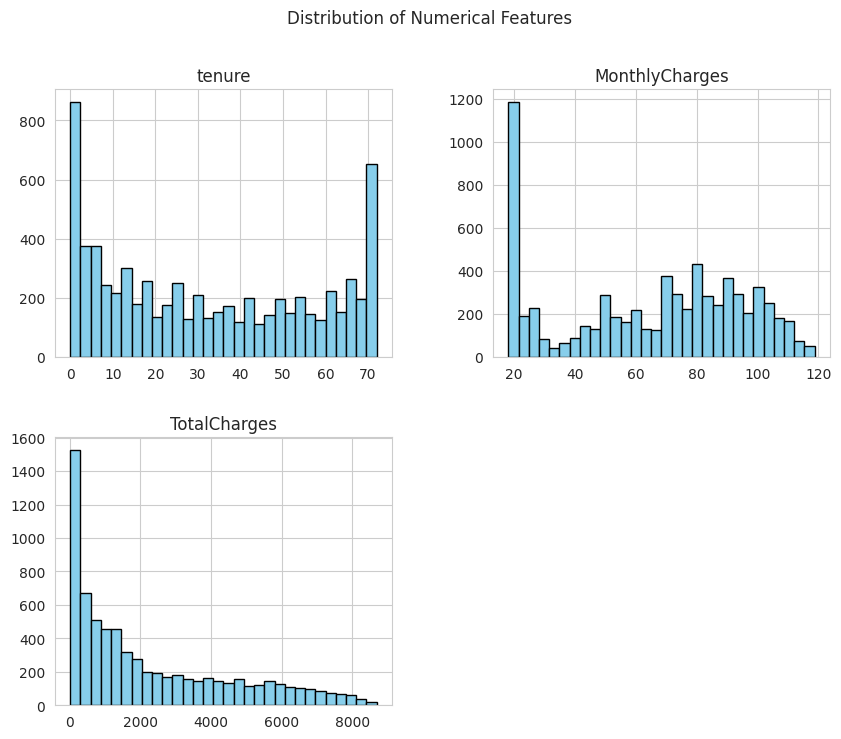

In [126]:
# Plot distributions of numerical features
numerical_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']

churn_df[numerical_cols].hist(bins=30, figsize=(10, 8), color='skyblue', edgecolor='black')
plt.suptitle('Distribution of Numerical Features')
plt.show()

From this, we can see that 800 people have been with the provider in **less than** a month. Around 600+ people have been staying longer than 70 months. This means most of the customers have been with the telco for less than a year. They don't have data of long-term customers with more than 3 years churning.

1200 people pay around 20 for Monthly Charges. This reflects in the TotalCharges as there are a lot of customers who pay less than 2000 for their service. So most of the customers in their churn data, don't really spend much on the provider's services.


From this, let's see their relationship with churn:

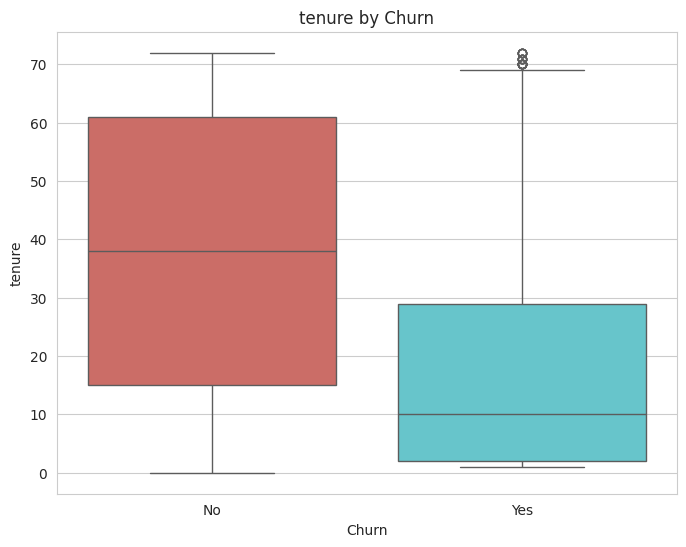

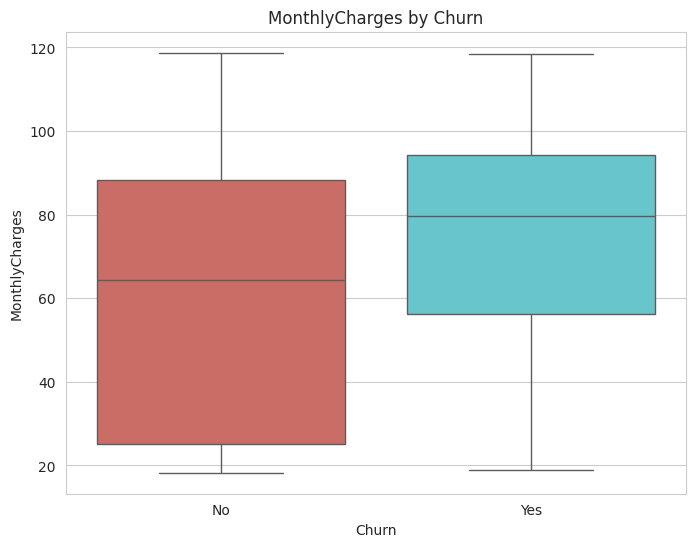

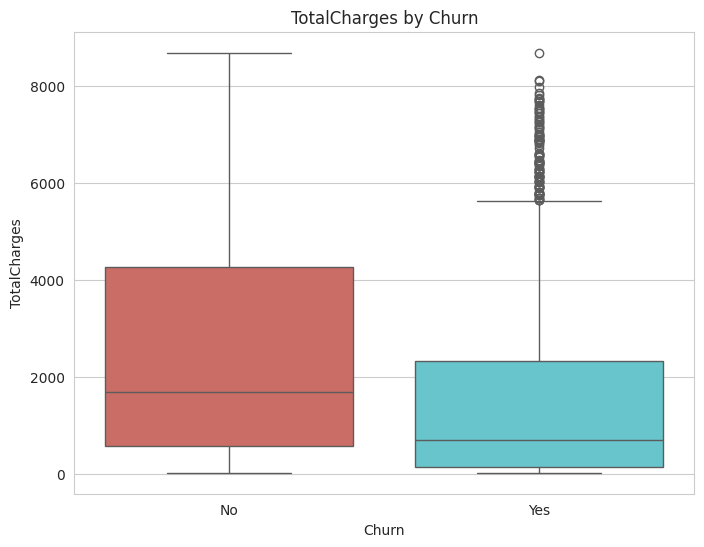

In [127]:
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Churn', y=col, data=churn_df, palette='hls')
    plt.title(f'{col} by Churn')
    plt.show()

Here's what we can gather:

*   People with less tenure tended to churn more.
*   People in the upper bracket who pay more monthly charges tended to churn more.
* Those who pay less Total Charges, churn a lot more. But there's a lot of outliers, meaning people who pay more for their Total Charges, also churned.







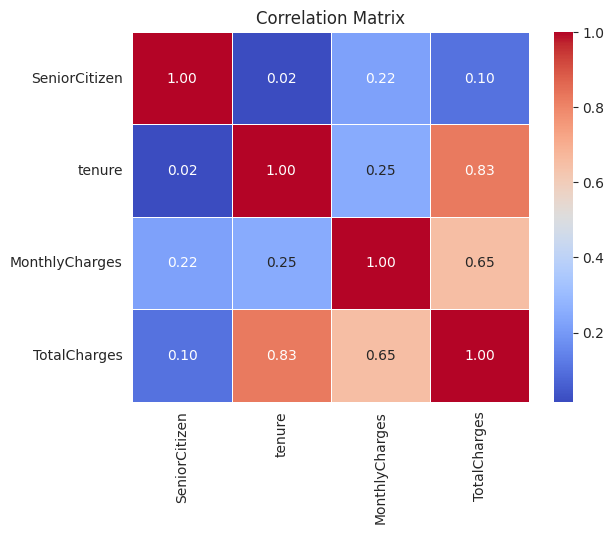

In [128]:
# Select only numerical columns for correlation
numerical_cols = churn_df.select_dtypes(include=['number']).columns

# Compute correlation matrix for numerical features
corr_matrix = churn_df[numerical_cols].corr()

# Generate heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [129]:
# Compute correlation matrix for numerical features
corr_matrix = churn_df[numerical_cols].corr()

print(corr_matrix)

                SeniorCitizen    tenure  MonthlyCharges  TotalCharges
SeniorCitizen        1.000000  0.016567        0.220173      0.102411
tenure               0.016567  1.000000        0.247900      0.825880
MonthlyCharges       0.220173  0.247900        1.000000      0.651065
TotalCharges         0.102411  0.825880        0.651065      1.000000


**Correlation**

*   The strongest correlation is between tenure and total charges (0.8259), indicating that longer-tenured customers tend to have higher total charges.
* Monthly charges and total charges also have a moderate positive correlation (0.6511).
* The correlations involving SeniorCitizen are weak, with no strong relationships observed between it and the other features.



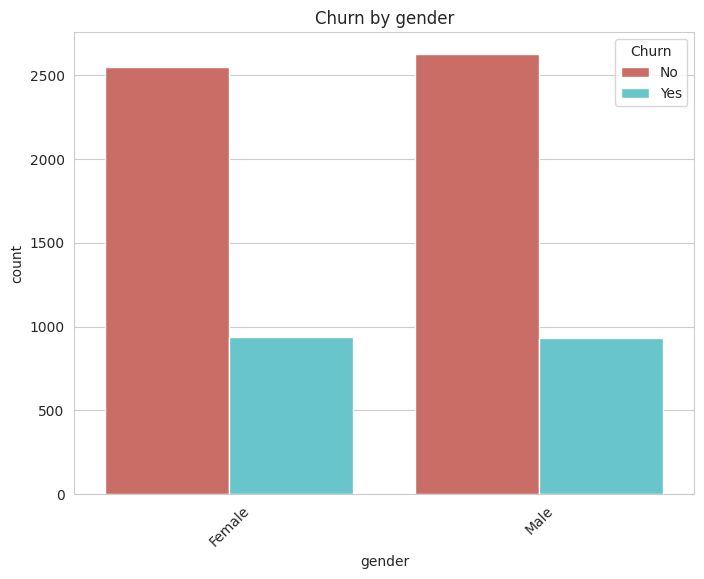

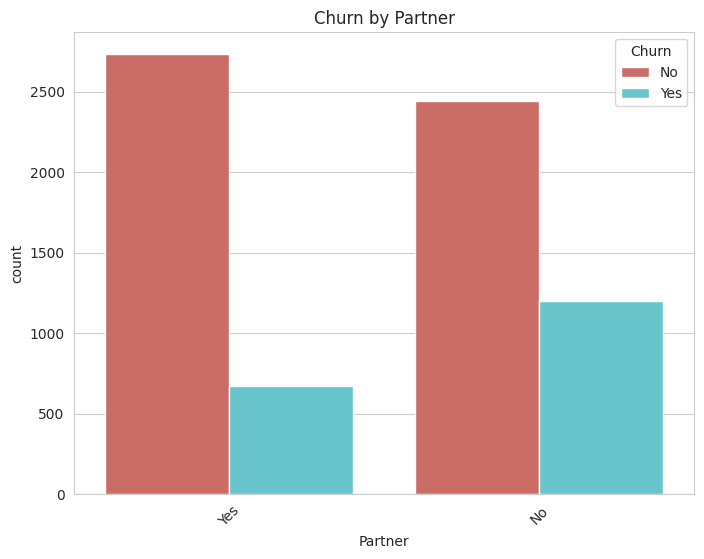

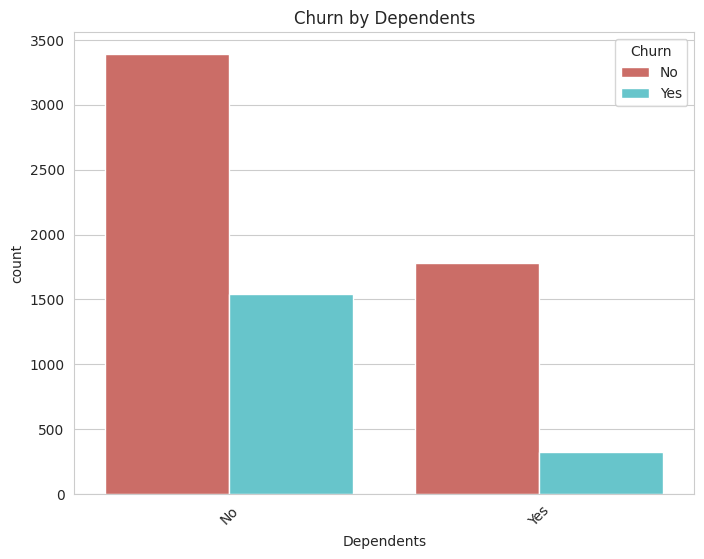

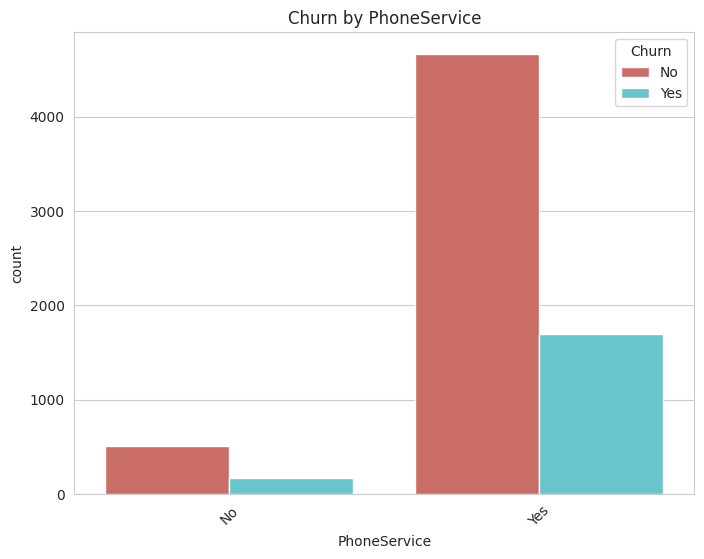

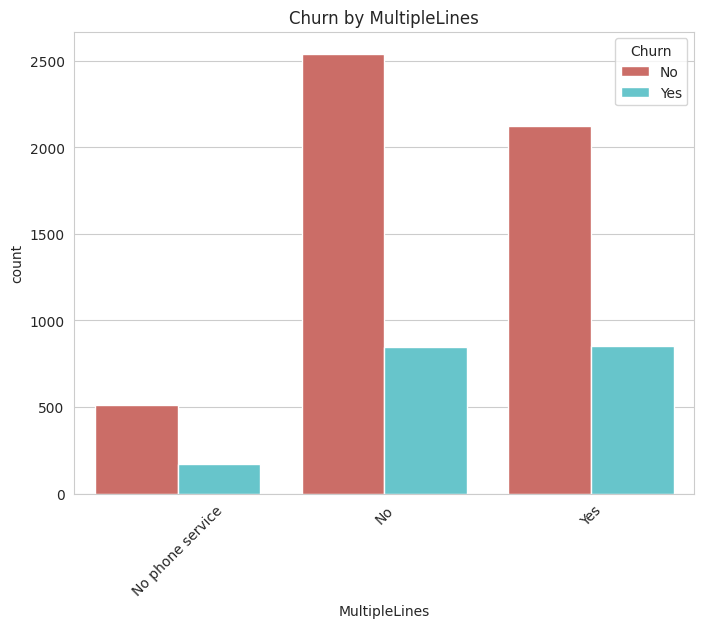

...

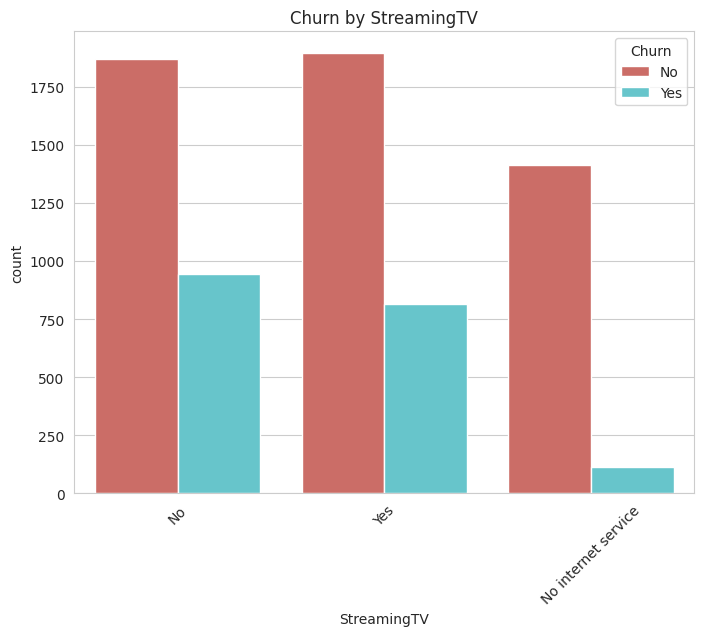

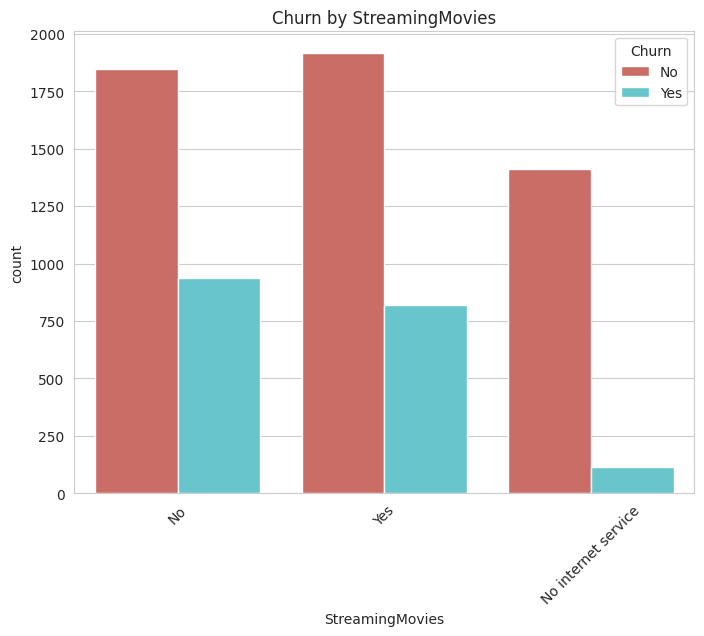

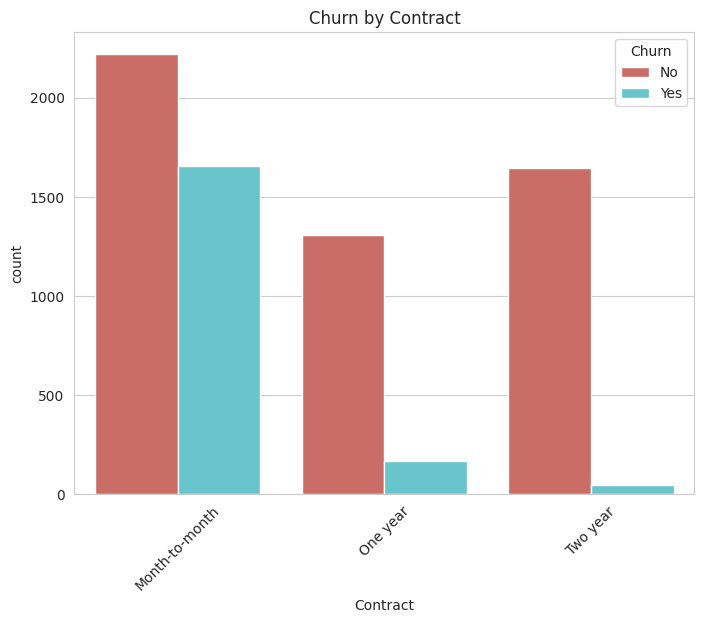

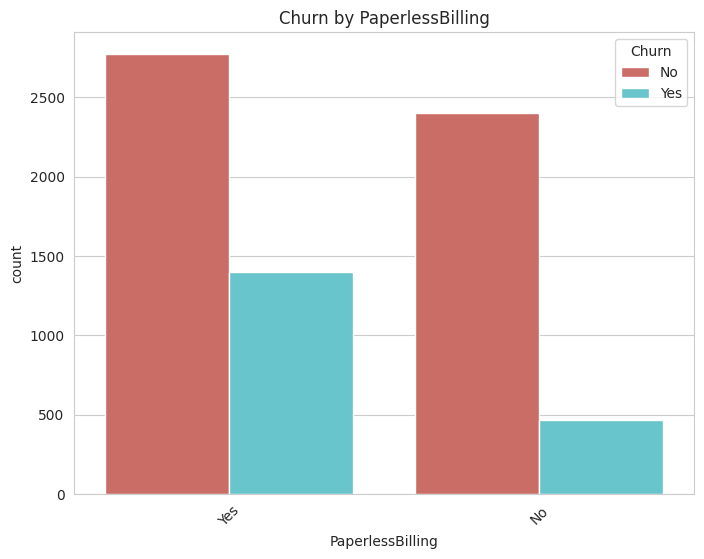

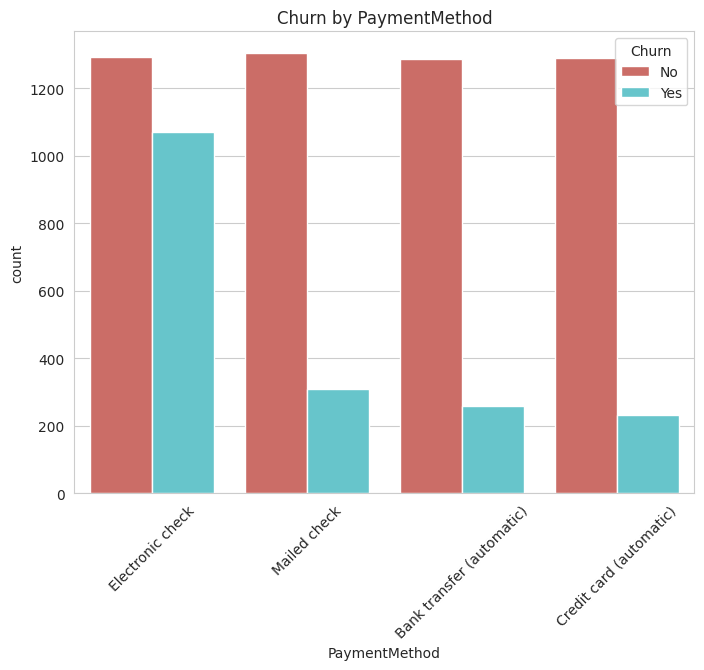

In [130]:
# Exclude 'customerID' and 'Churn' from categorical columns
categorical_cols = churn_df.select_dtypes(include=['object', 'category']).columns
categorical_cols = categorical_cols[(categorical_cols != 'customerID') & (categorical_cols != 'Churn')]

# Visualize each categorical feature and its relationship with churn
for col in categorical_cols:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=col, hue='Churn', data=churn_df, palette='hls')
    plt.title(f'Churn by {col}')
    plt.xticks(rotation=45)
    plt.show()

When comparing categorical features to churning, there's still a lot of people who don't churn base from categories. But from those who churn, here are things that we gather:


*   No difference in churning by gender.
*   Having no partner, dependents and Phone Service might influence more people churning.
*   No phone service when having Multiple Lines have less people churning
* Having Fiber optic internet have more people churning compared to the others.
* No OnlineSecuritty, No OnlineBackUp, NoDeviceProtection have more people churning compared to their other options.
* **People also churn more if they don't have TechSupport**
* **Having Month-to-Month Contract means you're more likely to churn.**
* **Using Electronic Check as payment method means you're more likely to churn.**



# **Data-Preprocessing**



> The data pre-processing was in one chunk of code so I elected to split them up into smaller parts so I can understand better how it was cleaned. Feel free to ignore the notes.



In [131]:
#Create a copy of data
model_data = churn_df.copy(deep=True)

#remove customerId column from the model data
model_data.drop("customerID", inplace=True, axis=1)

## Converting Categorical Data to Numeric

> *Note (please ignore): `lambda x:` defines an anonymous function that takes one argument, `x`. The expression that follows the colon specifies what the function will return based on the input x. Basically it is used for short, throwaway functions, particularly when passing a function as an argument to higher-order functions like `apply().`*





In [132]:
# Convert gender to numeric
model_data.gender = model_data.gender.apply(lambda x: 1 if x == 'Female' else 0)

# Convert SeniorCitizen, Partner, Dependents, PhoneService, PaperlessBilling, Churn, and others
for c in ['SeniorCitizen', 'Partner',
          'Dependents', 'PhoneService',
          'PaperlessBilling', 'Churn',
          'MultipleLines', 'OnlineSecurity',
          'OnlineBackup', 'DeviceProtection',
          'TechSupport', 'StreamingTV',
          'StreamingMovies']:
    model_data[c] = model_data[c].apply(lambda x: 1 if x == 'Yes' else 0)


## Handling Numeric Data

In [133]:
# Convert TotalCharges to float
model_data.TotalCharges = pd.to_numeric(model_data.TotalCharges, errors='coerce')
model_data.TotalCharges = model_data.TotalCharges.fillna(value=-1)

## One-Hot Encoding for Categorical Features


In [134]:
# One hot encode features with multiple categories
multi_categorical_features = ['InternetService', 'Contract', 'PaymentMethod']
enc = OneHotEncoder(handle_unknown='ignore')
res = enc.fit_transform(model_data[multi_categorical_features])

# Displaying the one-hot encoded results
display(res)
display(res)
display(res.todense())

res_df = pd.DataFrame(res.todense(), columns=enc.get_feature_names_out())
display(res_df)

<7043x10 sparse matrix of type '<class 'numpy.float64'>'
	with 21129 stored elements in Compressed Sparse Row format>

<7043x10 sparse matrix of type '<class 'numpy.float64'>'
	with 21129 stored elements in Compressed Sparse Row format>

matrix([[1., 0., 0., ..., 0., 1., 0.],
        [1., 0., 0., ..., 0., 0., 1.],
        [1., 0., 0., ..., 0., 0., 1.],
        ...,
        [1., 0., 0., ..., 0., 1., 0.],
        [0., 1., 0., ..., 0., 0., 1.],
        [0., 1., 0., ..., 0., 0., 0.]])

,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
7039,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
7040,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
7041,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [135]:
# Drop original multi-categorical features
model_data.drop(multi_categorical_features, axis=1, inplace=True)

# Concatenate the one-hot encoded DataFrame with the model data
model_data = pd.concat([model_data, res_df], axis=1)

# Display the first few rows of the updated model data
model_data.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,1,0,1,0,1,0,0,0,1,0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,0,0,0,34,1,0,1,0,1,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,0,0,0,0,2,1,0,1,1,0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0,0,0,0,45,0,0,1,0,1,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,1,0,0,0,2,1,0,0,0,0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


## **Splitting the Data**

In [136]:
X = model_data.drop("Churn", axis=1) #store to X the features used for modeling (independent variables)
y = model_data["Churn"]#store to y our target (dependent variable)

In [137]:
model_data.Churn.value_counts()

,count
Churn,
0,5174
1,1869


In [138]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

## **Why aren't we scaling?**
> For a RandomForest Classifier, scaling isn't strictly necessary, as this model type is typically robust to unscaled data. Random forests are tree-based algorithms and, unlike distance-based models (e.g., KNN) or models assuming normally distributed data (e.g., linear regression), they don't rely on feature scaling for optimal performance.

# **Random Forest Classifer**

In [139]:
param_grid = {
    "n_estimators": range(100, 150, 10),
    "max_depth": range(5,50,5),
    "min_samples_split": np.arange(.1,.6,.1),
    "min_samples_leaf": np.arange(.1,.6,.1),
    "max_features": np.arange(0.1, 0.6, .1)
}

clf = RandomForestClassifier()
clf_grid = RandomizedSearchCV(clf, param_grid, n_iter=25)
clf_grid.fit(X_train, y_train)

RandomizedSearchCV(estimator=RandomForestClassifier(), n_iter=25,
                   param_distributions={'max_depth': range(5, 50, 5),
                                        'max_features': array([0.1, 0.2, 0.3, 0.4, 0.5]),
                                        'min_samples_leaf': array([0.1, 0.2, 0.3, 0.4, 0.5]),
                                        'min_samples_split': array([0.1, 0.2, 0.3, 0.4, 0.5]),
                                        'n_estimators': range(100, 150, 10)})

## Evaluating Model

In [140]:
# Make predictions for the test set
X_test = pd.DataFrame(X_test, columns=X_train.columns)
y_pred_test = clf_grid.best_estimator_.predict(X_test)

# Print accuracy for the training and test sets
print("Accuracy on training set: {:.3f}".format(clf_grid.best_estimator_.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(clf_grid.best_estimator_.score(X_test, y_test)))

Accuracy on training set: 0.781
Accuracy on test set: 0.775


In [141]:
# View confusion matrix for test data and predictions
confusion_matrix(y_test, y_pred_test)

print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.78      0.96      0.86      1552
           1       0.72      0.25      0.37       561

    accuracy                           0.77      2113
   macro avg       0.75      0.61      0.62      2113
weighted avg       0.76      0.77      0.73      2113



# **Applying LIME**


*  LIME focuses on training local surrogate models to explain individual predictions.
*   LIME is **model-agnostic**, meaning that it can be applied to any machine learning model. The technique attempts to understand the model **by perturbing the input of data samples and understanding how the predictions change.**


*LIME was imported in preliminaries*



In [142]:
# Create LIME explainer
explainer = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Not Churn', 'Churn'],
    mode='classification'
)


According to the repository, LIME has one explainer for all the models.

> `class_names=['Negative', 'Positive']`: This parameter defines the names of the classes in the classification task. It allows LIME to use human-readable labels when displaying the predictions and their explanations, helping users understand which class is being predicted.


> `mode='classification`': This indicates that the explainer is being set up for a classification task. LIME has different modes for classification and regression, and specifying the mode ensures that LIME uses the appropriate methods for generating explanations based on the type of prediction being made.


## Predicting a Specific Instance


> Instance is basically the data point we want to explain. For this it's the 5th in the dataset (starting from 0). In this part, we'll select 5 instances to predict and explain.

**Instances we'll be using:**

*   5th Instance
*   20th Instance
*   100th Instance
*   500th Instance
*   1000th Instance


### **5th Instance**



In [143]:
# Choose an instance to explain
instance_idx5 = 5  # Would just have to change this index to explain other instances
instance= X_test.iloc[instance_idx5]

In [144]:
# Explain the prediction
explanation = explainer.explain_instance(
    data_row=instance,
    predict_fn=clf_grid.best_estimator_.predict_proba
)

In [145]:
# Show the explanation
explanation.show_in_notebook(show_table=True)
explanation.as_list()

[('Contract_Month-to-month <= 0.00', -0.17213360046654175),
 ('0.00 < InternetService_Fiber optic <= 1.00', 0.08694925198582848),
 ('PaymentMethod_Electronic check <= 0.00', -0.04615767575223738),
 ('tenure > 56.00', -0.04064811658050412),
 ('Contract_Two year > 0.00', -0.03329019034346412),
 ('MonthlyCharges > 90.05', 0.021069899762226233),
 ('TotalCharges > 3857.01', -0.017462885059539093),
 ('0.00 < StreamingMovies <= 1.00', 0.006057867995838788),
 ('InternetService_No <= 0.00', 0.0056450802876704415),
 ('Contract_One year <= 0.00', 0.005515586903943149)]

**How does LIME Explainer work?**
*   The model's predicted probabilities for each class are displayed at the top. We can see here that the probability of churning is 90% while the probability of not churning is 10% — this means that the customer is most likely to stay with the Telco.
*   The chart in the center lists features split by color: blue bars represent features that push the prediction towards "Negative," while orange bars push it towards "Positive."
* Each feature’s importance (the length of the bar) reflects how much it contributes to the instance's final classification. The larger the bar, the more influence that feature has on the prediction.
* On the right, the values for each important feature in this instance are listed.

> It is important to remember that in this case, **negative means less likely to churn** and **postive means more likely to churn**.


In [146]:
instance = X_test.iloc[instance_idx5]
print(instance)

gender                                        1.00
SeniorCitizen                                 0.00
Partner                                       0.00
Dependents                                    0.00
tenure                                       72.00
PhoneService                                  1.00
MultipleLines                                 1.00
OnlineSecurity                                1.00
OnlineBackup                                  1.00
DeviceProtection                              1.00
TechSupport                                   1.00
StreamingTV                                   0.00
StreamingMovies                               1.00
PaperlessBilling                              1.00
MonthlyCharges                              107.40
TotalCharges                               7748.75
InternetService_DSL                           0.00
InternetService_Fiber optic                   1.00
InternetService_No                            0.00
Contract_Month-to-month        

#### **Explanation of 5th Instance**

The model predicts that **the customer will not churn** with a **probability of 87%**. The top features that influenced the model's prediction are:

`Contract_Two year`:
*  This feature has a negative impact on the prediction and indicates that the customer has a two year contract. This type of contract is likely to result in a higher probability of the customer staying, as they are committed to the service for a longer period.

`Contract_Month-to-Month`:
*   The reason we recall the data above is that it shows that the customer doesn't have a month-to-month contract. This adds evidence the explanation above where longer contract means the customer is more likely to stay.

`tenure`:
*  This feature has a negative impact on the prediction. The customer has high tenure with the provider, which means they've committed to the service for a longer period and might have already become loyal to their provider.

`InternetService_Fiber optic`:
* This feature also has a positive impact indicating that since the customer has fiber optic internet service they are more likely to churn. This type of internet service is more expensive, and hence the customer may be less likely to switch providers.

`Monthly Charges`:
* This feature has a positive impact, indicating the customer has high monthly charges; their monthly charges is higher than the 90.05 threshold. Higher charges could make customers more likely to switch to a more affordable option.


`PaymentMethod_Electronic check`:
* This has a negative impact since the customer does not use electronic check as their payment method. This means that customers using electronic check are more likely to churn.

### **20th Instance**

In [147]:
# Choose an instance to explain
instance_idx20 = 20
instance = X_test.iloc[instance_idx20] # Would just have to change this index to explain other instances

# Explain the prediction
explanation = explainer.explain_instance(
    data_row=instance,
    predict_fn=clf_grid.best_estimator_.predict_proba
)

# Show the explanation
explanation.show_in_notebook(show_table=True)
explanation.as_list()

[('Contract_Month-to-month <= 0.00', -0.17068683610043),
 ('tenure <= 9.00', 0.08877307783531027),
 ('InternetService_Fiber optic <= 0.00', -0.08746296157567067),
 ('PaymentMethod_Electronic check <= 0.00', -0.0453795280952348),
 ('Contract_Two year > 0.00', -0.03547316417133524),
 ('35.50 < MonthlyCharges <= 70.57', -0.019044570507671985),
 ('TotalCharges <= 396.33', 0.01603462566349688),
 ('StreamingMovies <= 0.00', -0.007113027552626885),
 ('InternetService_No <= 0.00', 0.005838480155854987),
 ('PaperlessBilling <= 0.00', -0.004779284878045845)]

In [148]:
instance = X_test.iloc[instance_idx20]
print(instance)

gender                                       1.00
SeniorCitizen                                0.00
Partner                                      1.00
Dependents                                   1.00
tenure                                       6.00
PhoneService                                 0.00
MultipleLines                                0.00
OnlineSecurity                               0.00
OnlineBackup                                 1.00
DeviceProtection                             1.00
TechSupport                                  1.00
StreamingTV                                  0.00
StreamingMovies                              0.00
PaperlessBilling                             0.00
MonthlyCharges                              40.55
TotalCharges                               217.50
InternetService_DSL                          1.00
InternetService_Fiber optic                  0.00
InternetService_No                           0.00
Contract_Month-to-month                      0.00


#### **Explanation of 20th Instance**

The model predicts that the customer **will not churn**, with a **probability of 84%**. This prediction is based on the following factors:

`Contract_Two year`:
* The customer has a two-year contract, which suggests a higher likelihood of staying with the service.

`tenure`:
* The customer haven't been with the service for long. This is why it becomes a postive factor because they don't have brand loyalty yet.

`InternetService_Fiber optic`:
* This feature also has a negative impact indicating that since the customer does not have fiber optic internet service. This type of internet service is more expensive, and hence the customer may be more likely to switch providers. In this case, unlike the 5th instance, their Total charge is lower, which we can add more evidence that having fiber optic would make customers churn maybe because of the cost.

`PaymentMethod_Electronic check`:
* This customer does not use electronic check as their payment method. This adds more evidence that customers using electronic check are more likely to churn.

`Monthly Charges`:
* Unlike the 5th instance, this one is negative because they have lower monthly charges. Lower monthly charges mean less likely to churn.

`Total Charge`:
* Unlike the 5th instance, this one is positive because they have lower total charge. This might be a discrepancy since monthly charges being low is less likely to churn, but total charge means they churn.

### **100th Instance**

In [149]:
# Choose an instance to explain
instance_idx100 = 100
instance = X_test.iloc[instance_idx100] # Would just have to change this index to explain other instances

# Explain the prediction
explanation = explainer.explain_instance(
    data_row=instance,
    predict_fn=clf_grid.best_estimator_.predict_proba
)

# Show the explanation
explanation.show_in_notebook(show_table=True)
explanation.as_list()

[('0.00 < Contract_Month-to-month <= 1.00', 0.16981723895457904),
 ('InternetService_Fiber optic <= 0.00', -0.0874059842795879),
 ('PaymentMethod_Electronic check <= 0.00', -0.044384696933509014),
 ('Contract_Two year <= 0.00', 0.03644235285566242),
 ('MonthlyCharges <= 35.50', -0.02296371473539057),
 ('9.00 < tenure <= 29.00', -0.012722433826762716),
 ('396.33 < TotalCharges <= 1387.40', 0.010838080238174994),
 ('Contract_One year <= 0.00', 0.007743313726209957),
 ('InternetService_No > 0.00', -0.006079672128254639),
 ('StreamingMovies <= 0.00', -0.005135313459428617)]

#### **Explanation of 100th Instance**

The model predicts that the customer **will not churn**, with a **probability of 75%**. This is less than the previous customers. The prediction is based on the following factors:

`Contract_Month-to-Month`:
* Unlike 5th and 20th instances, this customer has a month-to-month contract. This means that they have shorter commitment with the provider, and easier to switch since their contracts expire every month. Because of this, it adds more to the possibility of churning.

`tenure`:
* The customer have been with the service for relatively long. This is why it becomes a negative factor because they are committed and have been commited to the provider for long despite having monthly contracts.

`InternetService_Fiber optic`:
* This customer  does not have fiber optic internet service. Just like the 20th instance, their Total charge is lower, which we can add more evidence that having fiber optic would make customers churn maybe because of the cost.

`PaymentMethod_Electronic check`:
* This customer does not use electronic check as their payment method. This adds more evidence that customers using electronic check are more likely to churn.

`MonthlyCharges`:
* The customer has lower monthly charges. Since this is negative, it means that less monthly charges means less likelihood of churning.

`Total Charge:`
* Just like the 20th instance, their total charge is less. Their total charge is also positive, which means having less total charge means higher churn.

### **500th Instance**

In [150]:
# Choose an instance to explain
instance_idx500 = 500
instance = X_test.iloc[instance_idx500] # Would just have to change this index to explain other instances

# Explain the prediction
explanation = explainer.explain_instance(
    data_row=instance,
    predict_fn=clf_grid.best_estimator_.predict_proba
)

# Show the explanation
explanation.show_in_notebook(show_table=True)
explanation.as_list()

[('Contract_Month-to-month <= 0.00', -0.17035969833898995),
 ('0.00 < InternetService_Fiber optic <= 1.00', 0.08434552756700421),
 ('0.00 < PaymentMethod_Electronic check <= 1.00', 0.04895236148637557),
 ('29.00 < tenure <= 56.00', -0.03831563031345993),
 ('Contract_Two year <= 0.00', 0.036607947937710786),
 ('70.57 < MonthlyCharges <= 90.05', 0.02163596347641663),
 ('1387.40 < TotalCharges <= 3857.01', -0.01011788767026978),
 ('StreamingMovies <= 0.00', -0.00703143012194291),
 ('PaperlessBilling <= 0.00', -0.006153625612110057),
 ('Contract_One year > 0.00', -0.005931966745978562)]

In [151]:
instance = X_test.iloc[instance_idx500]
print(instance)

gender                                        1.00
SeniorCitizen                                 0.00
Partner                                       0.00
Dependents                                    0.00
tenure                                       32.00
PhoneService                                  1.00
MultipleLines                                 1.00
OnlineSecurity                                0.00
OnlineBackup                                  0.00
DeviceProtection                              0.00
TechSupport                                   0.00
StreamingTV                                   1.00
StreamingMovies                               0.00
PaperlessBilling                              0.00
MonthlyCharges                               84.05
TotalCharges                               2781.85
InternetService_DSL                           0.00
InternetService_Fiber optic                   1.00
InternetService_No                            0.00
Contract_Month-to-month        

#### **Explanation of 500th Instance**


The model predicts that the customer **will not churn**, with a **probability of 83%**. This is higher than the previous instance. The prediction is based on the following factors:

`Contract_Two year`:
* This leans to positive because they do not have two-year contract. They also do not have a month-to-month contract. When recalling their data, we see that they actually have a one-year data. This still provess the likelihood to churn becomes higher when they do not have a long term commitment.

`InternetService_Fiber optic`:
* This customer  has fiber optic internet service. Just like the 5th instance, their total and monthly charge is higher, which we can add more evidence that having fiber optic would make customers churn maybe because of the cost.

`PaymentMethod_Electronic check`:
* This customer uses electronic check as their payment method which is why it's mark as postive. This adds more evidence that customers using electronic check are more likely to churn.

`MonthlyCharges`:
* The customer has higher monthly charges. Since it is positive, it means that more monthly charges means more likelihood of churning.

`Total Charge:`
* However, like the 5th instance, their total charge is more. Their total charge is considered negative while they have higher total charge, but positive for having more monthly charge. The case here now is that having low total charge might mean they don't commit to the provider, and thus having more likelihood of churnout.

### **1000th Instance**

In [152]:
# Choose an instance to explain
instance_idx1000 = 1000
instance = X_test.iloc[instance_idx1000] # Would just have to change this index to explain other instances

# Explain the prediction
explanation = explainer.explain_instance(
    data_row=instance,
    predict_fn=clf_grid.best_estimator_.predict_proba
)

# Show the explanation
explanation.show_in_notebook(show_table=True)
explanation.as_list()

[('0.00 < Contract_Month-to-month <= 1.00', 0.17228061718311988),
 ('0.00 < InternetService_Fiber optic <= 1.00', 0.08812090982133158),
 ('PaymentMethod_Electronic check <= 0.00', -0.04497765051971721),
 ('tenure > 56.00', -0.03924436966548973),
 ('Contract_Two year <= 0.00', 0.03522077116670653),
 ('70.57 < MonthlyCharges <= 90.05', 0.018064780235605263),
 ('TotalCharges > 3857.01', -0.015822823082356333),
 ('InternetService_No <= 0.00', 0.007170446728684301),
 ('0.00 < PaperlessBilling <= 1.00', 0.004572460149831313),
 ('0.00 < StreamingMovies <= 1.00', 0.003746545881647647)]

#### **Explanation of 1000th Instance**


The model predicts that the customer **will not churn**, with a **probability of 62%**. This is **much** lower probability than the previous customers. The prediction is based on the following factors:

`Contract_Month-to-Month`:
* This leans to positive because they  have a month-to-month contract. The likelihood to churn becomes higher when they do not have a long term commitment.

`InternetService_Fiber optic`:
* The customer has fiber optic internet. Just like the 5th instance, having fiber optic intertnet meant the customers were more likely to churn.

`tenure:`
* The customer had high tenure, meaning they have been using the provider for a long time. Higher tenure meant that it is less likely for this customer to churn, hence why is it in the negative as a factor.

`PaymentMethod_Electronic check`:
* This customer does not use electronic check as their payment method. This adds more evidence that customers using electronic check are more likely to churn.

`MonthlyCharges`:
* The customer has higher monthly charges. Since it is positive, it means that more monthly charges means more likelihood of churning.

`Total Charge:`
* However, like the 500th instance, their total charge is more. Their total charge is considered negative when they have higher total charge, but positive for having more monthly charge. The case here now is that having low total charge might mean they don't commit to the provider, and thus having more likelihood of churnout.

# **Does LIME explain the predictions well?**


*   Did the chosen method highlight any unexpected feature importance?
*   How do the explanations align with your understanding of the Telco Churn domain?


<Axes: xlabel='importance', ylabel='feature'>

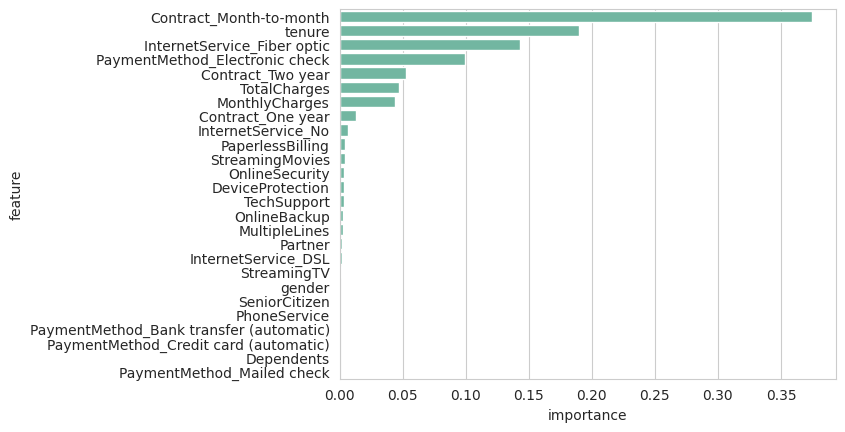

In [153]:
feat_df = pd.DataFrame()
feat_df['feature'] = X_train.columns
feat_df['importance'] = clf_grid.best_estimator_.feature_importances_
feat_df = feat_df.sort_values('importance', ascending=False)
sns.barplot(y=feat_df['feature'],
            x=feat_df['importance'])

Looking at the feature importance graph, we see that the analysis of individual customers by LIME actually align very well. In cases where the customer has a month-to-month contract or fiber optic internet, these features tend to increase the likelihood of churn. **This is consistent across different instances in our analysis**.

There was one unexpected feature, however. Higher monthly charge meant more likely to churn, but when looked at high total charge, the customers were likely to churn. There is discrepancy between the two. The most plausible explantation is that when customers face high monthly charges, they may feel the service is no longer worth the cost, particularly if they perceive comparable alternatives at lower prices. This dissatisfaction can lead to increased churn rates as they seek more affordable options. However, in the long run these monthly charges might accumulate to total charges over time. Customers with high total charges might be long-term subscribers who have invested significantly in the service. They may feel a sense of commitment or loyalty due to their investment, making them less likely to churn, despite higher cumulative costs.


All in all, the explanations do align good with telco churn insights. **The feature importance rankings mostly align with general expectation**s in the Telco Churning, where factors like contract type and internet service type are key indicators of customer loyalty. The prominence of "Contract_Month-to-month" is expected, as customers on short-term contracts typically have more flexibility to leave. Longer contracts are associated with retention, as they indicate a commitment. Customers who feel a commitment to their service provider are less likely to switch (Ribero et al., 2024)

Similarly, "InternetService_Fiber optic" showing higher importance aligns with known trends: fiber-optic users often face higher costs, which could increase churn likelihood. This is actually backd by Christopher and Anand (2024) who says that fiber optic service potentially leads to higher churn scores.


However, some features, like the relatively low importance of "tenure," may seem counterintuitive, as tenure usually indicates loyalty. This finding suggests that within this dataset, contract type and internet service may play a stronger role than tenure alone. Overall, the explanations are consistent with general Telco Churn insights, though some lower-ranked features might be worth investigating for unexpected influences.




> **References:**

> Christopher, D., & Anand, G. (2024, May). Comparative Analysis of Predictive Models for Customer Churn Prediction in the Telecommunication Industry. In 2024 International Conference on Communication, Computer Sciences and Engineering (IC3SE) (pp. 534-539). IEEE.

> Ribeiro, H., Barbosa, B., Moreira, A. C., & Rodrigues, R. G. (2024). Determinants of churn in telecommunication services: a systematic literature review. Management Review Quarterly, 74(3), 1327-1364.

# **SHAP (SHapley Additive exPlanations)**



## **Initializing SHAP**

In [154]:
shap.initjs()

In [155]:
# Create a SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(clf_grid.best_estimator_)

# Get SHAP values
shap_values = explainer.shap_values(X_train)

## **Visualizing SHAP values**


## Summary Plot

*   Provides a global view of feature importance across all instances.



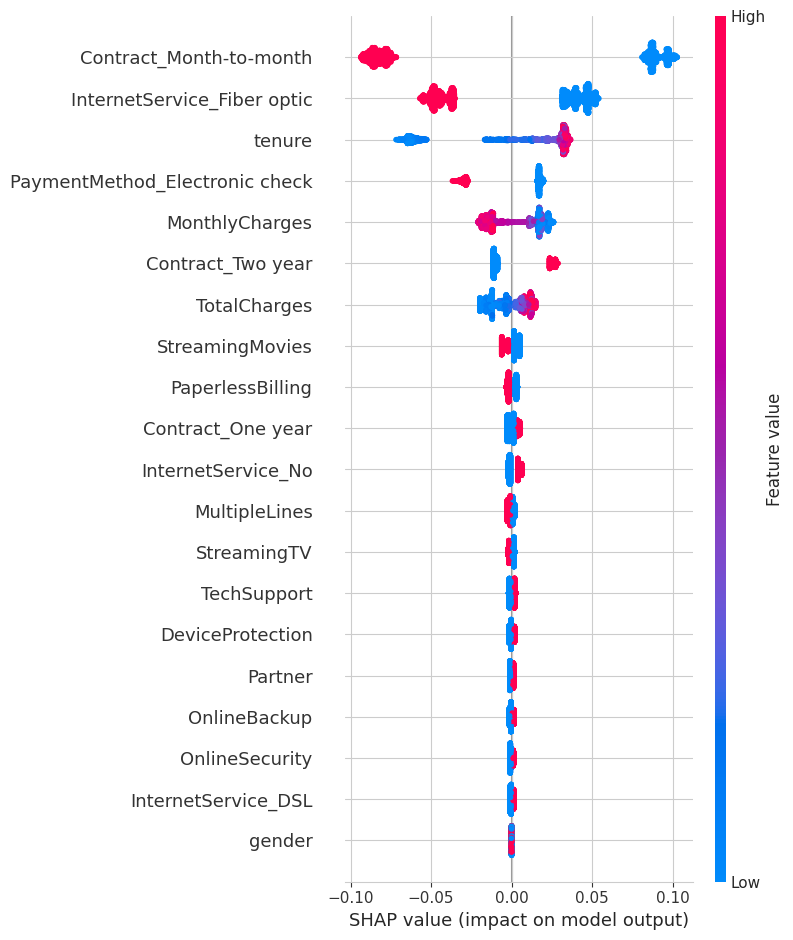

In [156]:
# Summary Plot
shap.summary_plot(shap_values[:, :, 0], X_train)

In the example code, `shap.summary_plot(shap_values[1], X_train) `doesn't work, but this code does. Why? This is because we're selecting selecting the first class (index 0) from the shap_values array since our model is a classifier with multiple classes (for binary classification, class 0 is often the negative class).

By using `shap_values[:, :, 0]`, we are providing the SHAP values for the first class to the summary_plot, which aligns with the feature data X_train.


## Feature Plot


*   Aggregates the SHAP values and displays the overall feature importance.



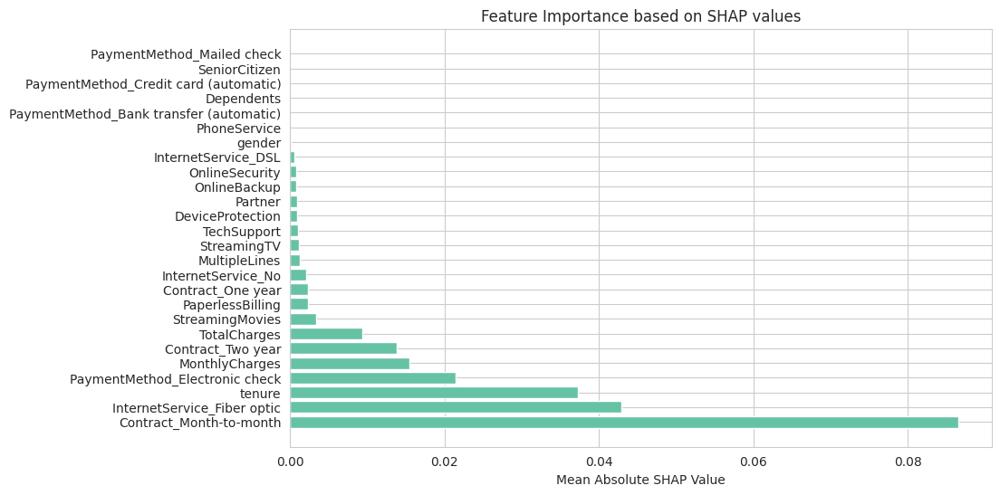

In [157]:
# Compute feature importances as the mean absolute SHAP value for each feature
shap_importance = np.abs(shap_values[:, :, 0]).mean(axis=0)

# Sort the importance values
sorted_idx = np.argsort(shap_importance)[::-1]

# Plot the feature importance as a bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), shap_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), X_train.columns[sorted_idx])
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance based on SHAP values')
plt.show()


In [158]:
importances = clf_grid.best_estimator_.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)


                                    Feature  Importance
19                  Contract_Month-to-month    0.374523
4                                    tenure    0.189949
17              InternetService_Fiber optic    0.143313
24           PaymentMethod_Electronic check    0.099175
21                        Contract_Two year    0.052452
15                             TotalCharges    0.047327
14                           MonthlyCharges    0.044266
20                        Contract_One year    0.013056
18                       InternetService_No    0.006497
13                         PaperlessBilling    0.004372
12                          StreamingMovies    0.004208
7                            OnlineSecurity    0.003694
9                          DeviceProtection    0.003657
10                              TechSupport    0.003505
8                              OnlineBackup    0.002678
6                             MultipleLines    0.002438
2                                   Partner    0

When we compare the SHAP results, it says that **the top 5 features** are:

1. Contract-Month-to-Month,
2. InternetService_FiberOptic,
3. tenure,
4. PaymentMethod_Electronic check, and  
5. Contract_Two year

When we check using `feature_importances` the same features appear, but both tenure and InternetService_FiberOptic are interchanged in ranks.



## **Why are the ranks between SHAP and RF's feature importance different?**


SHAP values reflect how much each feature contributes to an individual prediction, taking into account the interactions between features. Hence, it may give a different ranking.
Feature importances from Random Forests reflect how much each feature contributes to reducing impurity across the whole model, but it may be influenced by feature interactions and multicollinearity, leading to different rankings.


The different rankings between SHAP and Random Forest's feature importance arise because SHAP focuses on the **individual contribution of each feature to a specific prediction,** while Random Forest's feature importance is more of a **global measure of how much each feature reduces impurity** across the entire model.







## Waterfall Plot


We cannot create a waterfall plot for all instances, but we can try to create multiple waterfall plots for a sample of instances from our dataset. What we could do is to  generate waterfall plots for a random sample of predictions.


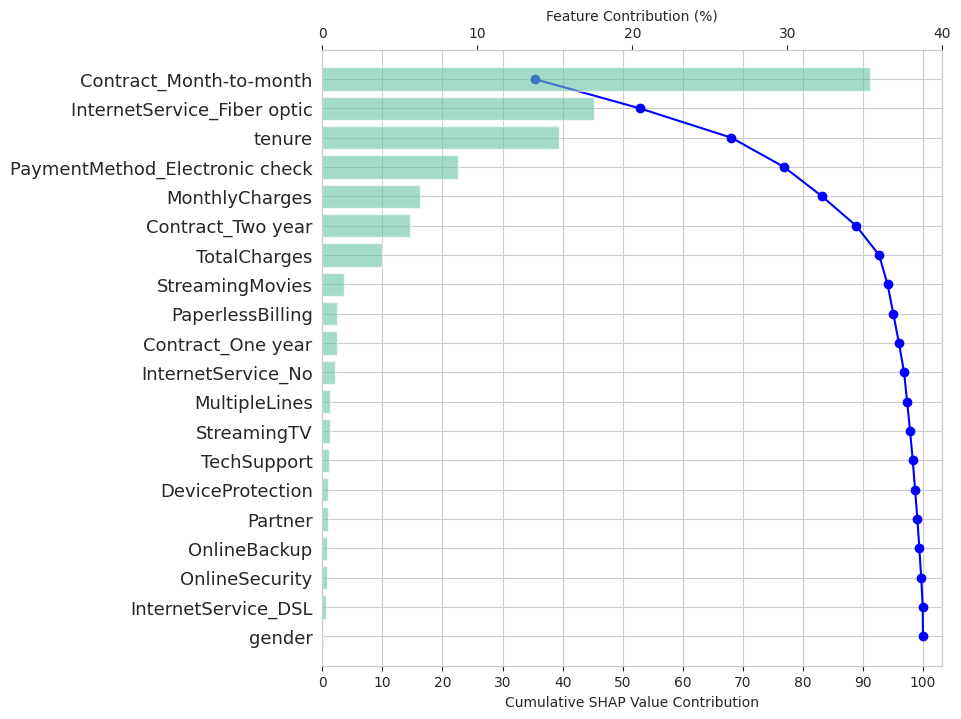

In [159]:
def make_shap_waterfall_plot(shap_values, features, num_display=20):
    '''
    A function for building a SHAP waterfall plot.

    SHAP waterfall plot is used to visualize the most important features in a descending order.

    Parameters:
    shap_values (numpy.ndarray or list): SHAP values obtained from a model (for a specific class)
    features (pandas DataFrame): a list of features used in a model
    num_display(int): number of features to display

    Returns:
    matplotlib.pyplot plot: SHAP waterfall plot
    '''

    # Calculate feature importance and order the features
    column_list = features.columns
    feature_ratio = (np.abs(shap_values).sum(0) / np.abs(shap_values).sum()) * 100
    column_list = column_list[np.argsort(feature_ratio)[::-1]]
    feature_ratio_order = np.sort(feature_ratio)[::-1]
    cum_sum = np.cumsum(feature_ratio_order)

    # Limit to num_display number of features
    column_list = column_list[:num_display]
    feature_ratio_order = feature_ratio_order[:num_display]
    cum_sum = cum_sum[:num_display]

    # Adjust the figure size depending on the number of features
    num_height = 0
    if (num_display >= 20) & (len(column_list) >= 20):
        num_height = (len(column_list) - 20) * 0.4

    fig, ax1 = plt.subplots(figsize=(8, 8 + num_height))
    ax1.plot(cum_sum[::-1], column_list[::-1], c='blue', marker='o')

    ax2 = ax1.twiny()
    ax2.barh(column_list[::-1], feature_ratio_order[::-1], alpha=0.6)

    ax1.grid(True)
    ax2.grid(False)

    ax1.set_xticks(np.arange(0, round(cum_sum.max(), -1)+1, 10))
    ax2.set_xticks(np.arange(0, round(feature_ratio_order.max(), -1)+1, 10))
    ax1.set_xlabel('Cumulative SHAP Value Contribution')
    ax2.set_xlabel('Feature Contribution (%)')

    ax1.tick_params(axis="y", labelsize=13)
    plt.ylim(-1, len(column_list))
    plt.show()

# Make sure shap_values[0] corresponds to the class you're interested (class 0 or class 1 for binary classification)
make_shap_waterfall_plot(shap_values[:, :, 0], X_train)

## Dependence Plot
* Shows how a feature’s value relates to its SHAP value globally.

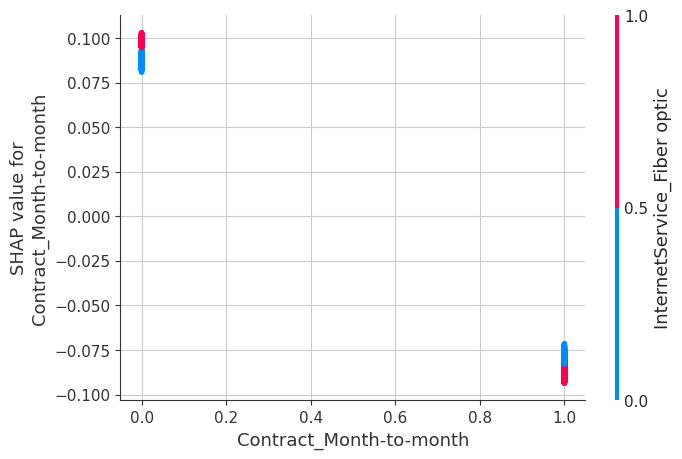

In [160]:
shap.dependence_plot('Contract_Month-to-month', shap_values[:, :, 0], X_train)


# **Does SHAP explain the predictions well?**


*   Did the chosen method highlight any unexpected feature importance?
*   How do the explanations align with your understanding of the Telco Churn domain?


## **Did the chosen method highlight any unexpected feature importance?**

SHAP **does highlight unexpected feature importance**. For instance, a** feature might appear less important in isolation but become significant when combined with another featur**e, highlighting unexpected relationships in the data.

In the case where  certain features like "tenure" and "InternetService_FiberOptic" have different rankings when looking at feature importances from SHAP values versus a global feature importance method like `feature_importances_` from RandomForest, SHAP might reveal that these features have differing impacts on individual predictions. This can indicate a more nuanced understanding of how these features affect the model for specific customers or predictions.

Unexpected feature importance emergeD when certain features, such as "Contract-Month-to-Month" or "PaymentMethod_Electronic check", are highlighted as significant even if they are not typically seen as the most obvious predictors of churn. For example, it's more surprising that Tech_Support or Online Services isn't as important as factors like payment method or contract type, suggesting that factors influencing churn may be more related to the way customers interact with their billing and service agreements than their experiences with support services or online features.

These insights emphasize that churn is not always a simple matter of dissatisfaction with service features (like Tech Support) but can be influenced by broader structural and transactional factors that affect a customer’s overall experience with the company.

## **How do the explanations align with your understanding of the Telco Churn domain?**


We can see that the features identified as most important are consistent with common knowledge about factors that influence customer churn in the telecommunications industry.

* `Contract-Month-to-Month`: This is a key feature, as customers with month-to-month contracts are less committed and can leave more easily. These customers may be more likely to churn compared to those with long-term contracts, who might feel more obligated to stay until their contract expires. From a business perspective, month-to-month contracts are typically associated with higher churn rates.

* `InternetService_FiberOptic`: The type of internet service is another critical feature. Fiber optic internet is often considered a premium service, and customers with this service may have a better experience, which can lead to a lower likelihood of churn. However, if customers are dissatisfied with the service quality or pricing, they could also churn if they feel the value doesn't justify the cost.

* `tenure`: Tenure represents how long a customer has been with the company. Longer-tenured customers are generally less likely to churn because they've established a relationship with the company. SHAP’s ranking of "tenure" as important reflects the common understanding that customers who have been with the company for a while are more likely to stay, either due to habit, satisfaction, or the perception of accumulated value.

* `PaymentMethod_Electronic` check: The method of payment is also highly influential. Customers who use electronic checks may represent a specific demographic or group of customers who have different behaviors compared to those who use credit cards or automatic billing. These customers might be less engaged, and the inconvenience or friction in the payment process could contribute to a higher likelihood of churn.

* `Contract_Two year`: Two-year contracts tend to be more stable and are designed to encourage customer retention. These contracts often come with discounts or other incentives, which makes customers less likely to churn before the end of their term. Customers in two-year contracts might be locked in for longer, so they're less likely to leave compared to month-to-month customers.

These feature rankings align well with the expectations in the Telco Churn domain: customers on short-term contracts, with premium internet service, and using certain payment methods are more likely to churn. This highlights the transactional and contractual nature of churn, rather than service-related features like customer support or internet reliability, which can often be overemphasized. The results emphasize the importance of contract flexibility, payment ease, and tenure in customer retention strategies.


# **PDP (Partial dependence Plots)**

> Partial Dependence Plots (PDPs) are visualizations used to show the relationship between a particular feature (or set of features) and the target variable, holding all other features constant. In the context of machine learning models, PDPs help interpret how changes in a single feature impact the model's predictions, especially for complex models like decision trees, random forests, or gradient-boosted models that are often not directly interpretable.



## Initializing PDP

In [161]:
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay

Let's say we want PDPs for the top features for the following: 'Contract_Month_to_Month', 'InternetService_FiberOptic', 'tenure', 'PaymentMethod_Electronic check', and 'Contract_Two year'.

<Figure size 640x480 with 0 Axes>

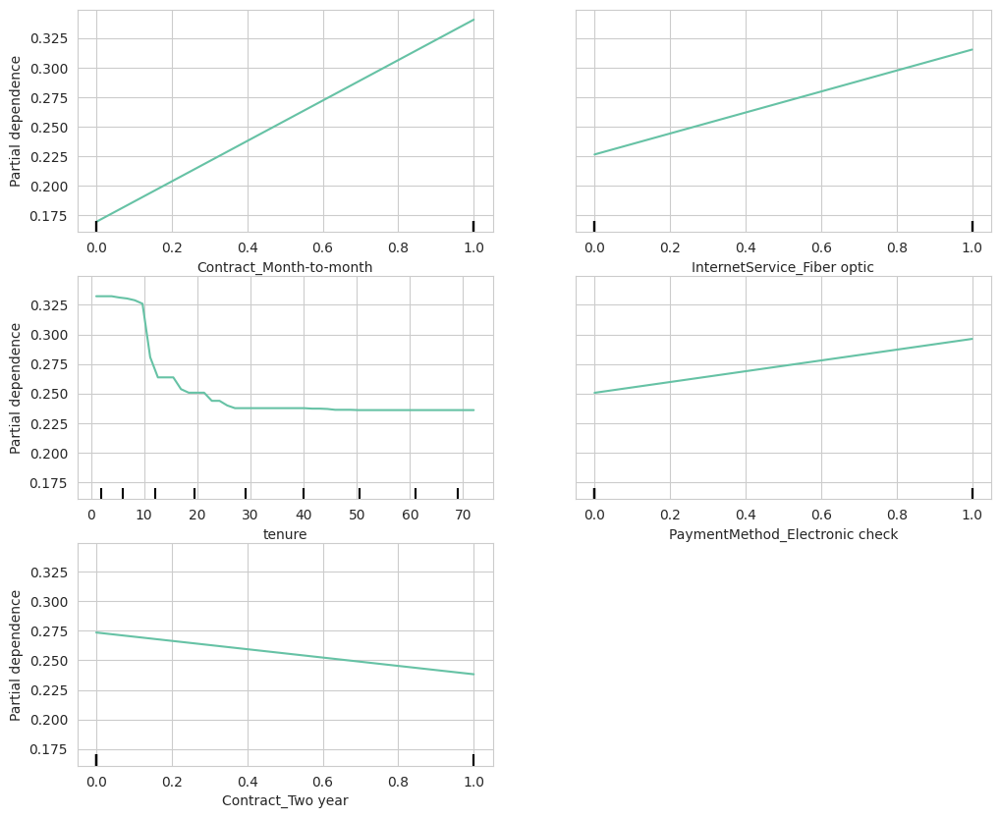

In [162]:
# Extract the best model from the grid search
best_model = clf_grid.best_estimator_

# Define features for PDPs
features = ['Contract_Month-to-month', 'InternetService_Fiber optic', 'tenure',
            'PaymentMethod_Electronic check', 'Contract_Two year']

# Generate Partial Dependence Plots for selected features
PartialDependenceDisplay.from_estimator(best_model, X_train, features, grid_resolution=50)

# Clear any prior plots
plt.clf()

# Show the plot with adjusted layout
fig, ax = plt.subplots(figsize=(12, 10))  # Increase figure size for better spacing
PartialDependenceDisplay.from_estimator(
    clf_grid.best_estimator_,
    X_train,
    features,
    grid_resolution=50,
    n_cols=2,  # Set to 2 columns for better readability
    ax=ax
)
plt.show()

This Partial Dependence Plot (PDP) provides insights into how specific features in the dataset affect the model's predictions, likely for a binary classification problem (such as customer churn). Here’s an interpretation of each feature:

* **Contract_Month-to-month:**
The partial dependence increases steadily with this feature, indicating that customers on month-to-month contracts are associated with a higher likelihood of churn. This aligns with common patterns in churn analysis, where flexible, short-term contracts often lead to higher churn rates.


* **InternetService_Fiber optic:** The partial dependence shows a slight increase as the value approaches 1, which suggests that customers with fiber-optic internet are more likely to churn than those without it. This could be due to factors like higher costs or service quality issues.


* **Tenure:** The partial dependence initially drops significantly and then stabilizes. This suggests that customers with shorter tenures are more likely to churn, but the likelihood decreases as tenure increases. This makes sense, as longer-term customers are often more loyal.


* **PaymentMethod_Electronic check:** There is a slight increase in partial dependence when the payment method is electronic check, indicating that customers paying with electronic checks may have a higher churn probability compared to those using other payment methods. This might be linked to customer preferences or satisfaction levels related to payment convenience.


* **Contract_Two year:** The partial dependence slightly decreases with this feature, suggesting that customers with two-year contracts are less likely to churn compared to those without such contracts. Longer-term contracts often correlate with customer retention.

## Grouped Partial Dependence Plot


A grouped partial dependence plot (PDP) is useful for visualizing the effect of a feature on predictions across different subgroups. This could be done by grouping data into categories and then plotting PDPs separately.

In [163]:
print(X_train.columns)


Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'PaperlessBilling', 'MonthlyCharges', 'TotalCharges',
       'InternetService_DSL', 'InternetService_Fiber optic',
       'InternetService_No', 'Contract_Month-to-month', 'Contract_One year',
       'Contract_Two year', 'PaymentMethod_Bank transfer (automatic)',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check'],
      dtype='object')


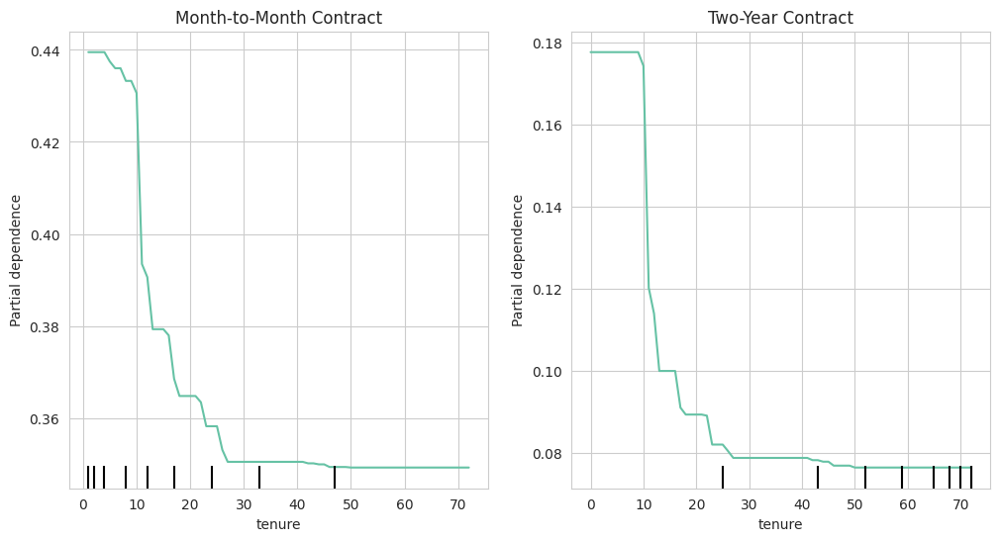

In [164]:
# Define subsets of the data for grouping
X_train_monthly = X_train[X_train['Contract_Month-to-month'] == 1]
X_train_two_year = X_train[X_train['Contract_Two year'] == 1]

# Plot PDP for each group separately
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

PartialDependenceDisplay.from_estimator(
    clf_grid.best_estimator_,
    X_train_monthly,
    features=['tenure'],
    ax=ax[0],
)
ax[0].set_title("Month-to-Month Contract")

PartialDependenceDisplay.from_estimator(
    clf_grid.best_estimator_,
    X_train_two_year,
    features=['tenure'],
    ax=ax[1],
)
ax[1].set_title("Two-Year Contract")

plt.show()

This Grouped Partial Dependence Plot (PDP) examines the impact of tenure on churn likelihood for customers with different contract types: month-to-month and two-year contracts. For month-to-month customers, churn probability starts relatively high, around 0.43, when tenure is close to zero, and it decreases sharply as tenure increases, stabilizing after about 10 months. This pattern suggests that newer customers on month-to-month contracts are more likely to churn, possibly due to limited commitment, but those who stay longer may be more satisfied or engaged, reducing their churn risk.

In contrast, customers with two-year contracts exhibit a lower baseline churn probability, starting around 0.2, which continues to decline as tenure increases, eventually stabilizing around 0.08. This lower initial churn risk likely reflects the binding nature of long-term contracts, where customers may feel more committed to stay. As their tenure grows, they are even less likely to churn, possibly due to completing a substantial portion of their contract.



The difference in partial dependence between the two contract types highlights that month-to-month customers have a higher baseline churn risk that reduces over time, while two-year contract customers start with a lower churn risk that further diminishes with increased tenure. This insight could inform retention strategies, such as targeting month-to-month customers with incentives to convert to longer-term contracts.

## Contrastive Partial Dependence Plot
Contrastive PDPs show the difference between two groups in terms of feature effect. This approach involves calculating PDPs for two groups and plotting the difference between them.

For instance, to contrast the PDP of "Month-to-Month" vs. "Two-Year" contracts on Monthly Charges:

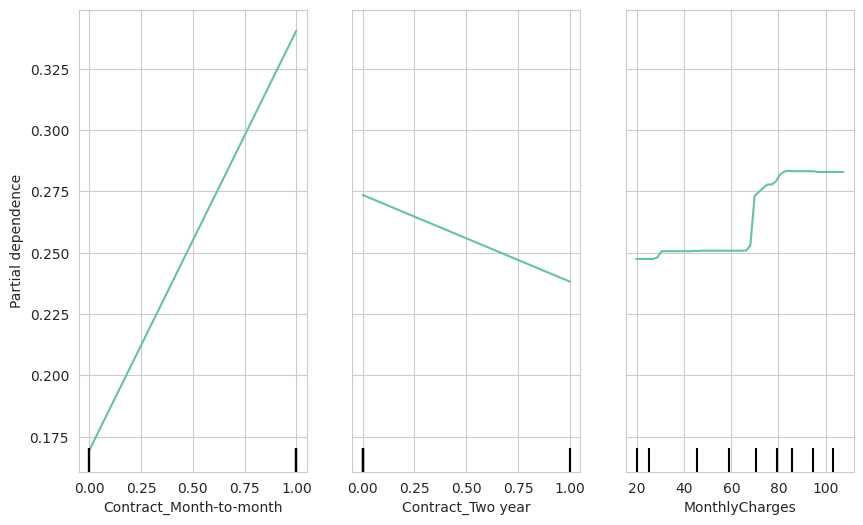

In [165]:
# Define the features for contrastive PDPs
features = ['Contract_Month-to-month', 'Contract_Two year', 'MonthlyCharges']

# Create the Partial Dependence Plot (PDP) for the selected features
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the partial dependence of each feature
PartialDependenceDisplay.from_estimator(clf_grid.best_estimator_,
                                        X_train,
                                        features=features,  # Indices of the selected features: MonthlyCharges, Contract_Month-to-Month, Contract_Two-year
                                        feature_names=X_train.columns,
                                        grid_resolution=50,
                                        ax=ax)

# Display the plot
plt.show()

This Contrastive Partial Dependence Plot (PDP) compares the effects of different contract types ("Month-to-Month" and "Two-Year") and Monthly Charges on the model's predictions, specifically looking at how these features influence the likelihood of churn.

**Interpretation:**

* `Contract_Month-to-month:`The partial dependence for the month-to-month contract shows a steep increase from around 0.15 to 0.35 as the feature value approaches 1. This suggests that having a month-to-month contract significantly raises the likelihood of churn, as customers on flexible, shorter contracts tend to have higher churn rates.


* `Contract_Two year:` In contrast, the partial dependence for the two-year contract decreases slightly with a higher feature value, remaining closer to 0.15–0.25. This implies that customers with two-year contracts have a lower risk of churn, likely due to the commitment involved in long-term contracts, which typically correlate with better customer retention.

* `Monthly Charges:` For monthly charges, the partial dependence plot shows a slight increase as the charges rise, particularly around the $50–$70 range, before stabilizing. This pattern indicates that customers with higher monthly charges might be somewhat more prone to churn, possibly due to the financial burden or perceived value relative to cost.


Overall, these contrastive PDPs reveal that month-to-month contracts are associated with a higher churn probability, while two-year contracts correlate with a lower churn risk. Additionally, higher monthly charges may contribute slightly to churn likelihood, suggesting that both contract type and cost sensitivity are important factors in predicting churn.

## Individual Conditional Expectation (ICE) Plot
ICE plots show how predictions vary for individual instances as a feature changes, providing insight into heterogeneity in feature effects across different samples. It is not PDP, but it's here to show the contrast on how PDP works. While PDP shows the average effect of tenure on churn risk across all customers. The ICE plot for tenure would show how the effect of tenure varies across different customers.

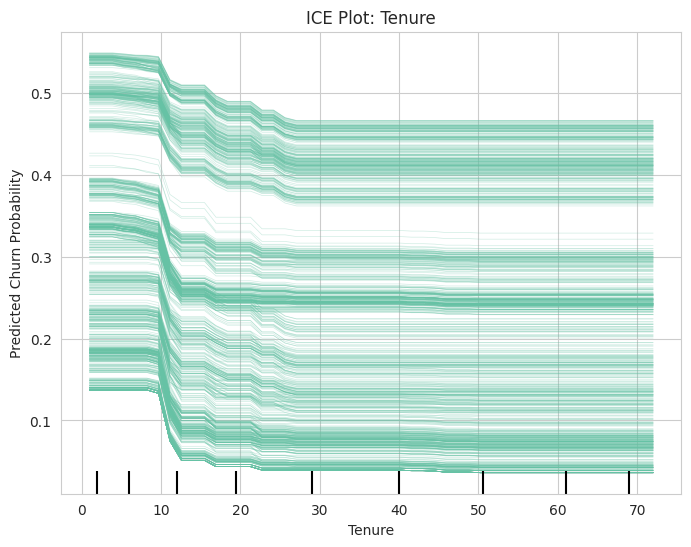

In [166]:
# Generate ICE plot
fig, ax = plt.subplots(figsize=(8, 6))

# Use the from_estimator method to generate ICE plot
PartialDependenceDisplay.from_estimator(
    clf_grid.best_estimator_,
    X_train,
    features=['tenure'],
    kind="individual",  # 'individual' shows ICE curves for each sample
    grid_resolution=50,
    ax=ax
)

# Customize the plot with labels and title
plt.title("ICE Plot: Tenure")
plt.xlabel("Tenure")
plt.ylabel("Predicted Churn Probability")

# Show the plot
plt.show()

# **Does PDP explain the predictions well?**


*   Did the chosen method highlight any unexpected feature importance?
*   How do the explanations align with your understanding of the Telco Churn domain?


Partial Dependence Plots (PDPs) provide a useful global view of the average impact of specific features on the predictions. However, PDPs might not capture complex interactions between features or reveal individual-level variability in the model's predictions. While PDPs can be very insightful for understanding general trends, they may miss important nuances, especially if the model's behavior changes significantly based on combinations of features.

PDPs, unlike SHAP (SHapley Additive exPlanations) and LIME (Local Interpretable Model-agnostic Explanations), are limited in their ability to highlight unexpected feature importance, particularly because they provide a global, averaged view of feature impact. This averaging process can obscure important nuances, such as how feature influence might vary significantly across different segments of data or among individual predictions.

Because PDPs show averaged effects, any unusual behavior in subsets of the data may be smoothed out. In contrast, SHAP and LIME highlight feature importance at an individual level, which can reveal cases where certain features play an unexpectedly critical role in driving predictions.

PDPs are typically plotted one feature at a time (or, at most, two). As a result, they struggle to capture interactions between features. SHAP values, however, account for interactions by considering the marginal contribution of each feature in every possible coalition with other features. Unexpected interactions that drive predictions can be missed by PDPs but are often captured by SHAP.

The PDP aligns closely with known patterns in the Telco Churn domain, reinforcing several industry insights about customer behavior. Like the LIME and SHAP analyses, PDP highlights that contract type, internet service type, and payment method are significant factors influencing churn rates, which are consistent with general expectations for the telecommunications industry.


# **LIME VS. SHAP VS. PDP**

> While PDPs provide useful global insights, SHAP and LIME are generally better suited for identifying unexpected feature importance, as they offer a deeper, instance-level view that can reveal hidden patterns and interactions.








**When PDPs Are Useful**
PDPs can still be valuable, especially as a quick, high-level diagnostic tool. They provide an easy-to-interpret overview of average feature impact and can be particularly useful when you expect feature effects to be relatively consistent across the dataset. They are also computationally cheaper than SHAP or LIME, making them suitable for an initial analysis.

**When SHAP or LIME Might Be Better**
For models with complex, non-linear relationships or those where feature interactions are likely important, SHAP or LIME is often more suitable. SHAP’s ability to break down individual predictions and attribute importance to each feature in a context-specific way makes it ideal for discovering unexpected behaviors and interactions. LIME, while local and approximate, can also highlight unexpected feature importance by building interpretable surrogate models that approximate the decision boundary in the vicinity of a single instance.